# Predictors Benchmark
## Datasets
Datasets **linear**, **moon** and **saturn** taken from https://bcomposes.wordpress.com/2015/11/26/simple-end-to-end-tensorflow-examples/.

Dataset **virus** generated using http://www.librec.net/datagen.html.

In [72]:
setwd("~/Projects/Try TensorFlow/simdata/")
linear <- read.csv("linear_data_train.csv", col.names = c("cat", "x", "y"))
linear.eval <- read.csv("linear_data_eval.csv", col.names = c("cat", "x", "y"))

moon <- read.csv("moon_data_train.csv", col.names = c("cat", "x", "y"))
moon.eval <- read.csv("moon_data_eval.csv", col.names = c("cat", "x", "y"))

saturn <- read.csv("saturn_data_train.csv", col.names = c("cat", "x", "y"))
saturn.eval <- read.csv("saturn_data_eval.csv", col.names = c("cat", "x", "y"))

virus <- read.csv("~/Data/virus/virus_data_train.csv", col.names = c("cat", "x", "y"))
virus.eval <- read.csv("~/Data/virus/virus_data_eval.csv", col.names = c("cat", "x", "y"))

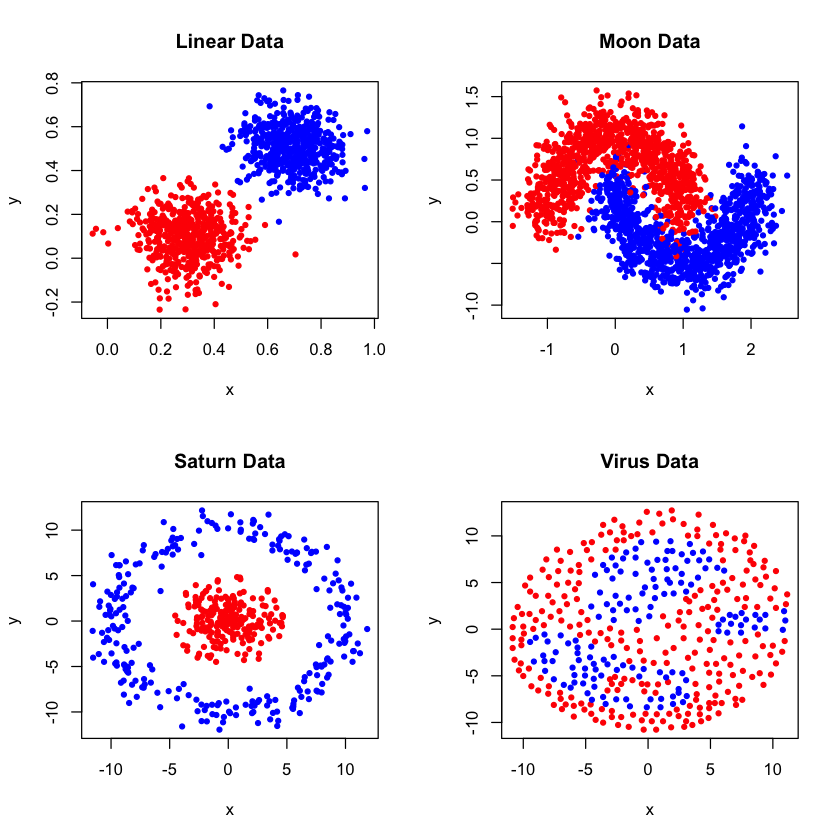

In [73]:
cols <- c("red", "blue")
par(mfrow = c(2, 2))
with(linear, plot(x, y, col = cols[cat + 1], pch = 20, main = "Linear Data"))
with(moon, plot(x, y, col = cols[cat + 1], pch = 20, main = "Moon Data"))
with(saturn, plot(x, y, col = cols[cat + 1], pch = 20, main = "Saturn Data"))
with(virus, plot(x, y, col = cols[cat + 1], pch = 20, main = "Virus Data"))

## Algorithms

In [99]:
source("~/Projects/ROC.R")

# run.model must return a vector of values between 0 and 1
test.model <- function(train, test, run.model, title = "")
{
  cat.predict <- run.model(train, test)
  # Plot trained and predicted data
  with(train, plot(x, y, col = cols[cat + 1], pch = 20, main = title))
  cat.predict.plot <- round(cat.predict)
  with(test, points(x, y, col = cols[cat.predict.plot + 1], pch = c(0, 4)[ifelse(cat.predict.plot == test$cat, 1, 2)]))
  # Compute and plot ROC curve
  roc <- rocBuild(cat.predict, test$cat == 1)
  rocPlot(
      roc$metrics$fp.rate,
      roc$metrics$tp.rate,
      roc$metrics$threshold,
      title = paste0("F-Score = ", round(roc$ctg05$f.score, 2))
  )
}

Good predictions are plotted using a **[]**.

Bad predictions are plotted using a **X**.

### Logistic Regression

In [75]:
test.glm <- function(train, test, title = "")
{
  test.model(
    train, test,
    function(train, test)
    {
      model <- suppressWarnings(glm(cat ~ x + y, data = train, family = "binomial"))
      return(predict(model, newdata = test[c("x", "y")], type = "response"))
    },
    title
  )
}

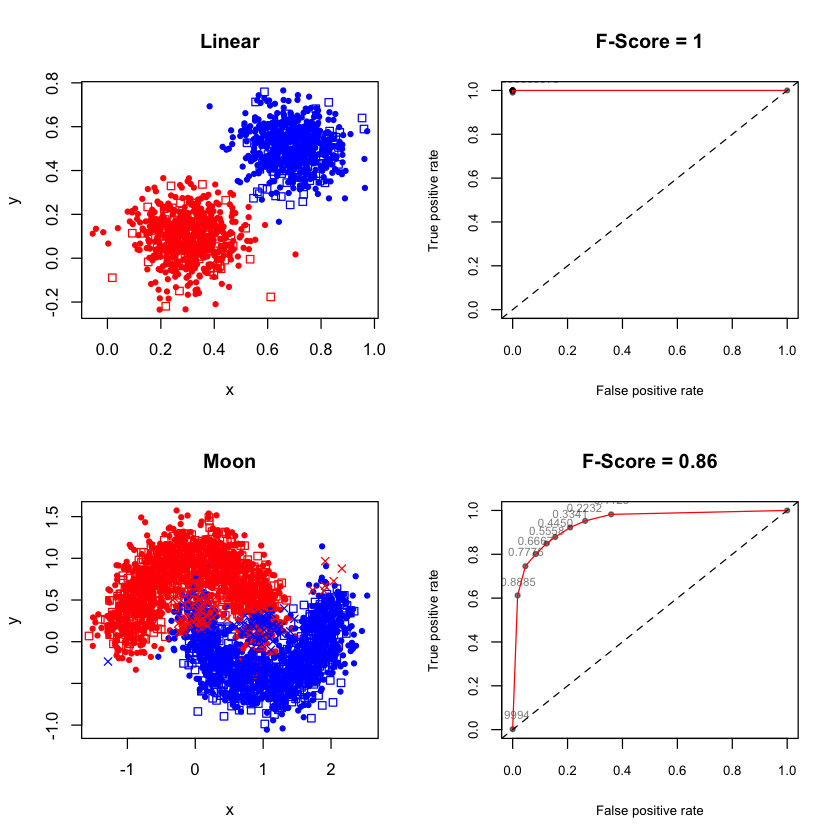

In [90]:
par(mfrow = c(2, 2))
test.glm(linear, linear.eval, "Linear")
test.glm(moon, moon.eval, "Moon")

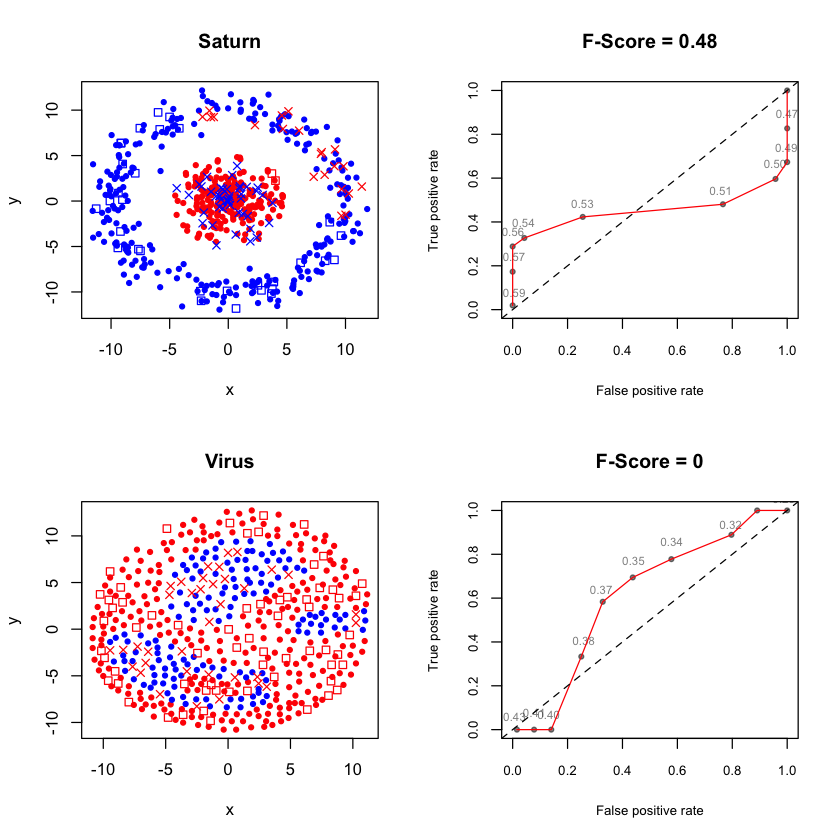

In [100]:
par(mfrow = c(2, 2))
test.glm(saturn, saturn.eval, "Saturn")
test.glm(virus, virus.eval, "Virus")

### Decision Tree

In [78]:
library(rpart)

test.tree <- function(train, test, title = "")
{
  test.model(
    train, test,
    function(train, test)
    {
      model <- rpart(cat ~ x + y, data = train)
      return(predict(model, newdata = test[c("x", "y")]))
    },
    title
  )
}

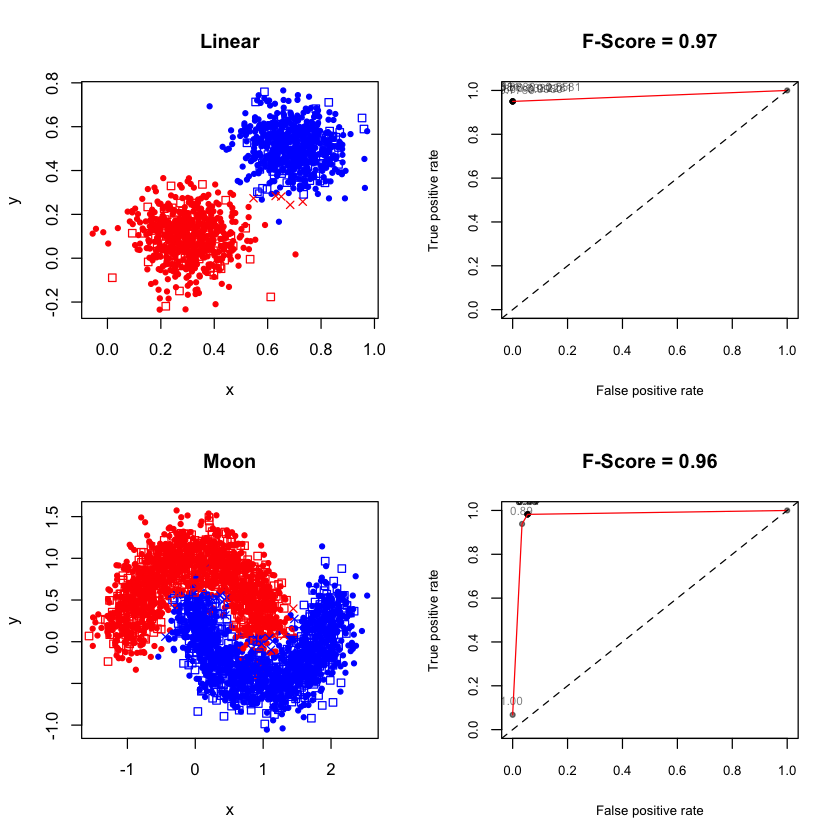

In [92]:
par(mfrow = c(2, 2))
test.tree(linear, linear.eval, "Linear")
test.tree(moon, moon.eval, "Moon")

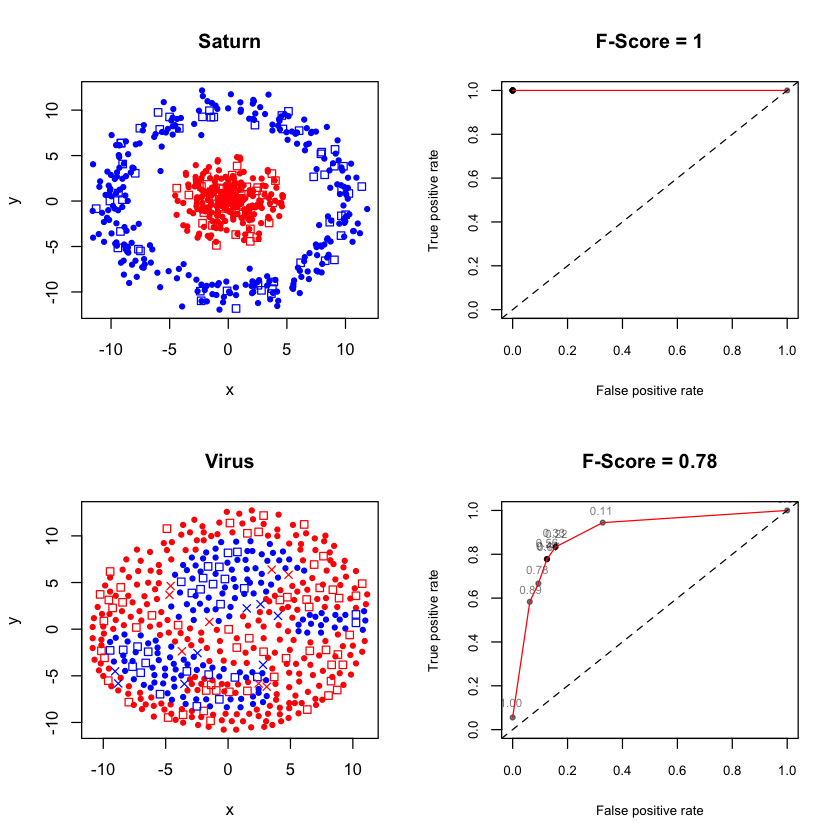

In [93]:
par(mfrow = c(2, 2))
test.tree(saturn, saturn.eval, "Saturn")
test.tree(virus, virus.eval, "Virus")

### K-Nearest Neighbors

In [81]:
library(class)

test.knn <- function(train, test, title = "")
{
  test.model(
    train, test,
    function(train, test)
    {
      p <- knn(train[c("x", "y")], test[c("x", "y")], train[,"cat"], k = 5)
      return(unclass(p) - 1)
    },
    title
  )
}

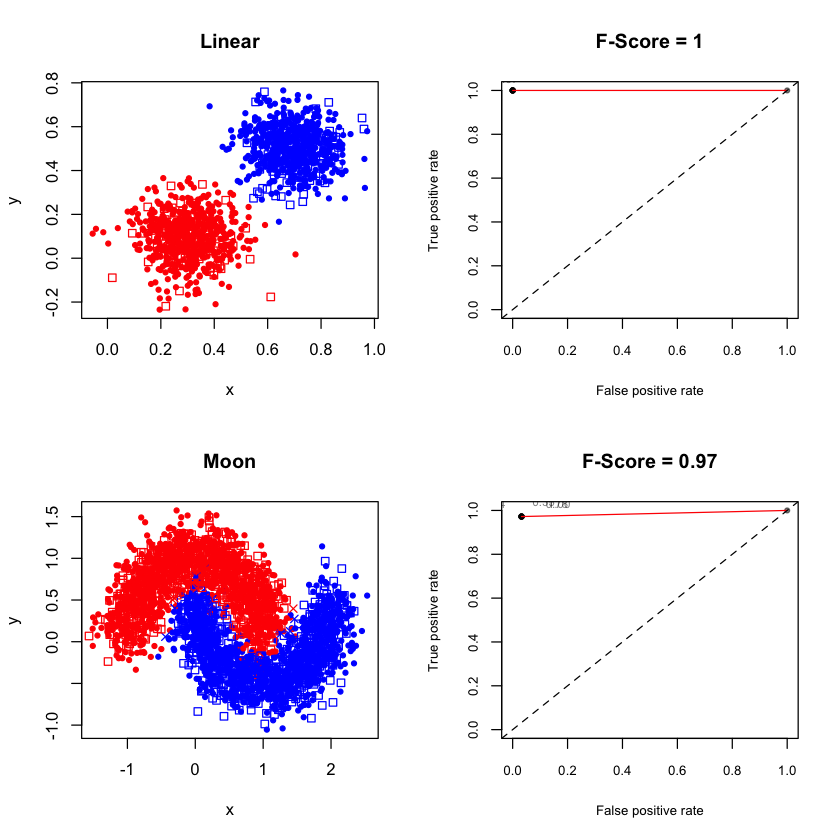

In [94]:
par(mfrow = c(2, 2))
test.knn(linear, linear.eval, "Linear")
test.knn(moon, moon.eval, "Moon")

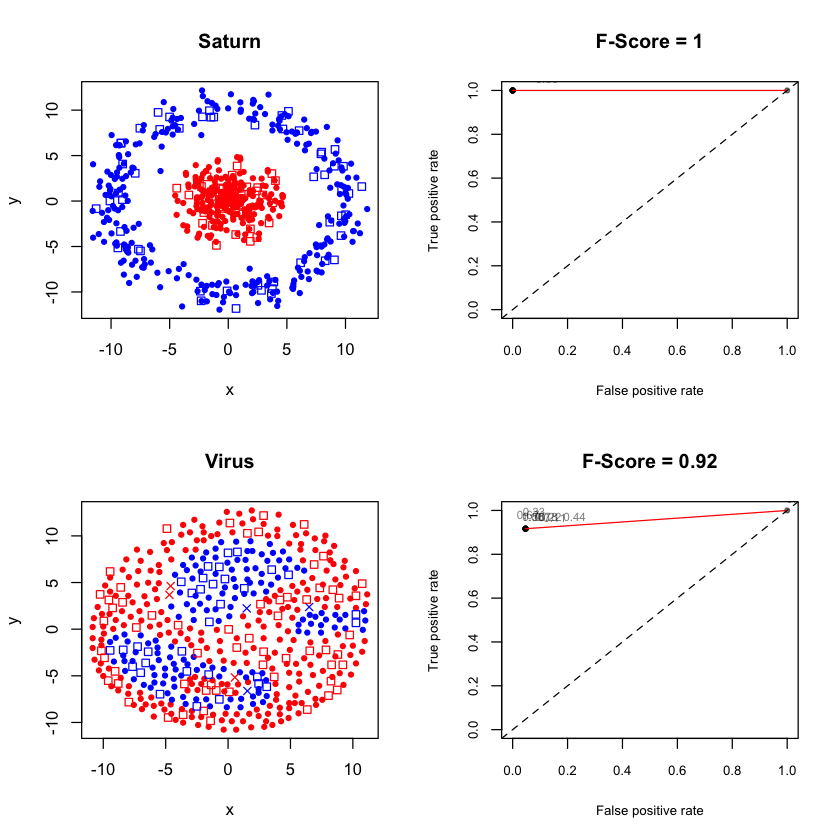

In [95]:
par(mfrow = c(2, 2))
test.knn(saturn, saturn.eval, "Saturn")
test.knn(virus, virus.eval, "Virus")

### Neural Network
One hidden layer with 3 neurons.

In [84]:
suppressMessages(library(neuralnet))

test.nn <- function(train, test, title = "", nn.hidden = c(3))
{
  test.model(
    train, test,
    function(train, test)
    {
      model <- neuralnet(cat ~ x + y, data = train, hidden = nn.hidden)
      return(compute(model, test[c("x", "y")])$net.result)
    },
    title
  )
}

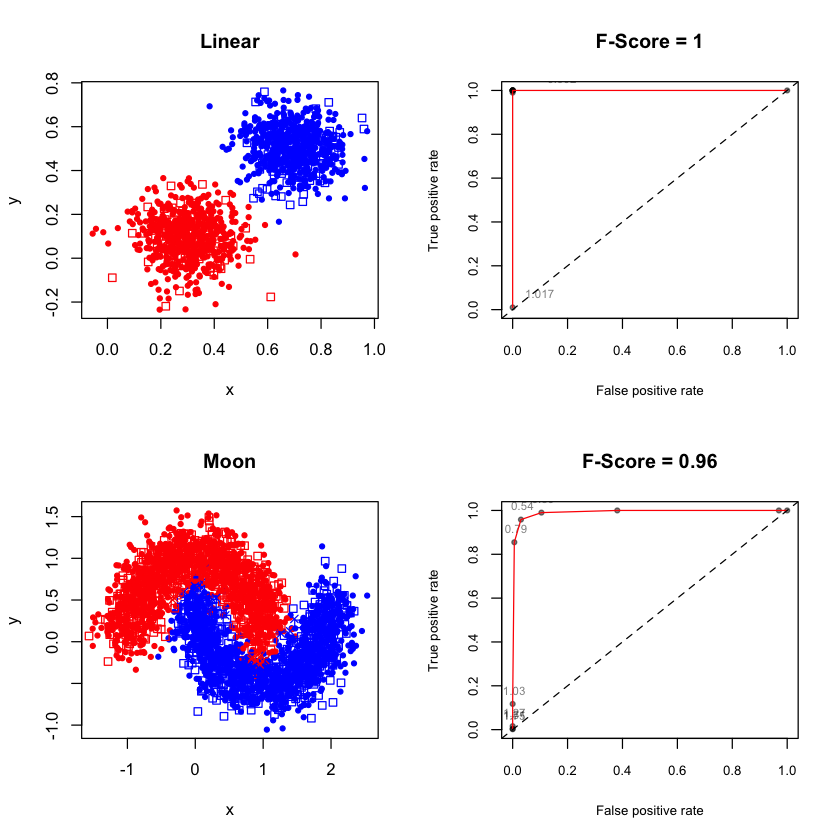

In [96]:
par(mfrow = c(2, 2))
test.nn(linear, linear.eval, "Linear")
test.nn(moon, moon.eval, "Moon")

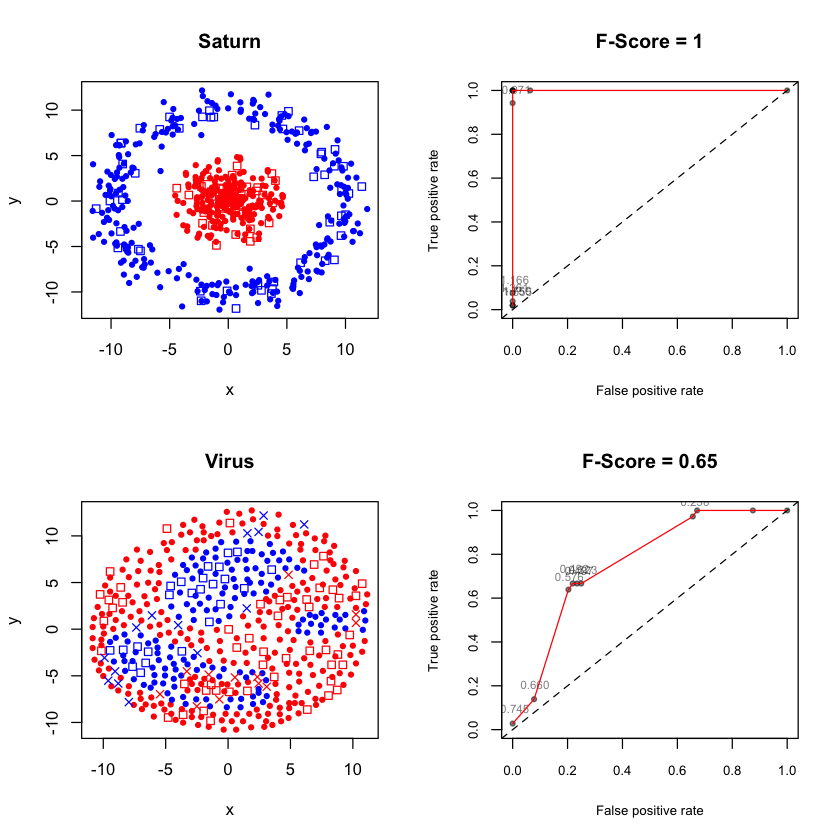

In [97]:
par(mfrow = c(2, 2))
test.nn(saturn, saturn.eval, "Saturn")
test.nn(virus, virus.eval, "Virus")

#### Adding hidden layers

Warning message:
: algorithm did not converge in 1 of 1 repetition(s) within the stepmaxWarning message:
In is.na(weights): is.na() applied to non-(list or vector) of type 'NULL'

ERROR: Error in nrow[w] * ncol[w]: non-numeric argument to binary operator


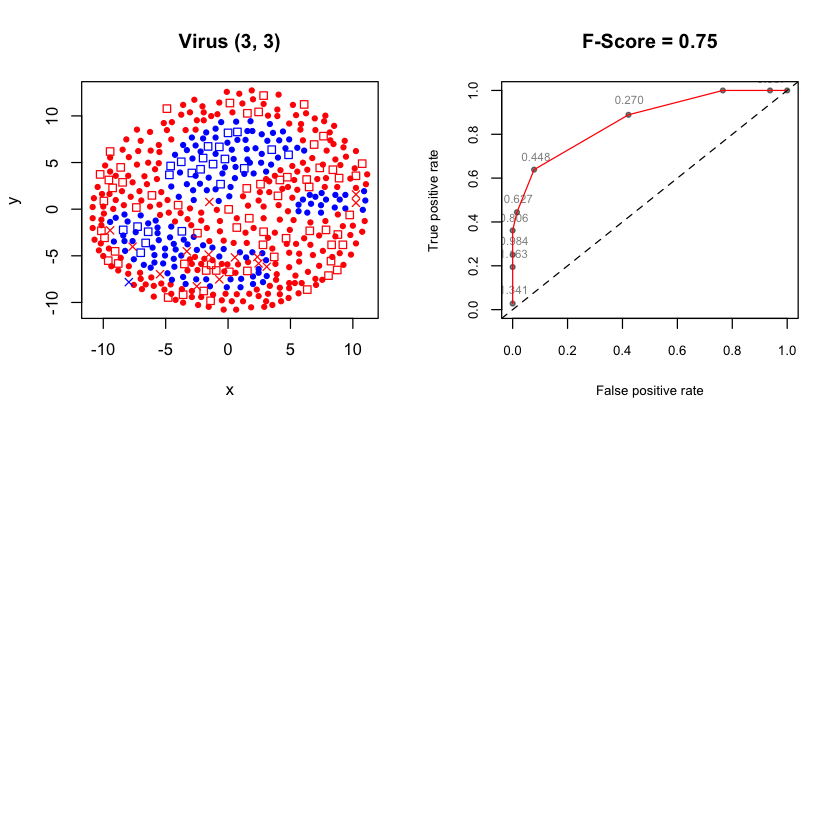

In [98]:
par(mfrow = c(2, 2))
test.nn(virus, virus.eval, "Virus (3, 3)", c(3, 3))
test.nn(virus, virus.eval, "Virus (6, 6)", c(3, 3))